In [53]:
import numpy as np
import matplotlib.pyplot as plt 
from scipy.integrate import odeint 
from scipy.integrate import solve_ivp
import random
import gillespie 
from scipy.interpolate import interp1d
import pdb

### ODE 


In [54]:
c=0.01
eps=0.01
K=50
def F(X,t):
    w,m=X[0],X[1]
    return (c*w*(K-w-m), c*m*(K-w-m) +m*eps)

temps=np.linspace(0,1500,1500)
sol=odeint(F,[40,10],temps)



In [55]:
w=sol[:,0]
m=sol[:,1]
h=m/(w+m)
#len(h)

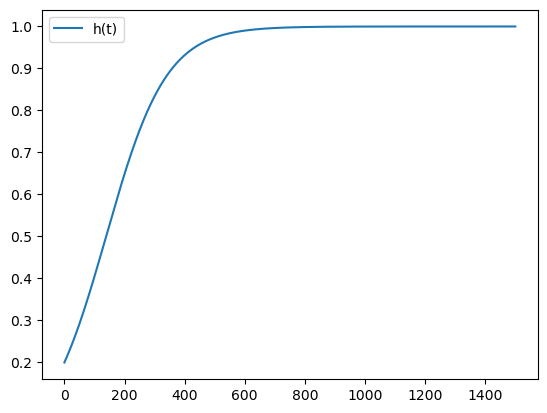

In [56]:
#plt.plot(temps, w, label='w(t)')
#plt.plot(temps, m, label='m(t)')

plt.plot(temps,h,label='h(t)')
# Ajout de légendes
plt.legend()

### stochastic 

In [5]:
#code de gillespie à la main 

In [108]:
# Paramètres
mu = 0.05
c = 0.01
K = 50
eps = 0.01
w0 = 40
m0 = 10
T = 1500
num_simulations = 100

# Initialisation de l'état initial
X = np.array([w0,m0])

# Matrice de stoichiométrie
V = np.array([[-1, 0, 1, 0],
              [0, -1, 0, 1]])

In [109]:
#Finally, when the rate changes with population size (as the replication rate does in our examples), rare
#stochastic fluctuations could cause the rate to become negative. Or you could initialise the system
#with a population size that makes the replication rate negative. To cover these cases, you can define
#a rate function that returns 0 if the rate has become negative, or the rate itself if it is positive.


def rate_function(rates):
    return max(rates,0)
    
    

In [122]:
from tqdm import tqdm
# Simulation des populations
all_times = []
all_populations = []

for sim in tqdm(range(num_simulations), desc="Simulations"): #pour voir où le code en est
    t = 0
    times_sim = [t]
    X = np.array([w0,m0])
    pop_sim = [X.copy()]
    

    while t <= T:
        # Calcul des taux
        a = np.array([rate_function(mu * X[0]),
                      rate_function(mu * X[1]),
                      rate_function((mu + c * (K - X[0] - X[1]))*X[0]),
                      rate_function((mu +c * (K - X[0] - X[1]) + eps)*X[1])])
        
        
        # Somme des taux
        somme = np.sum(a)
        # Debug print
        #print(f'Simulation {sim}, t = {t:.4f}, X = {X}, a = {a}, rate_sum = {somme:.4f}')
        if somme==0:
            print('No more events possible, breaking out of the loop.')
            break 
            
         # Sélection de la réaction
        r1 = np.random.rand()
        r_compare= r1*somme
        
        cumulative_sum = np.cumsum(a)
        j = np.searchsorted(cumulative_sum, r_compare)
        # Debugging information
        #print(f'Random number : {r1}')
        #print(f'Threshold for reaction selection: {r_compare}')
        #print(f'Cumulative sums: {cumulative_sum}, Selected reaction: {j}')
        
           # Vérification que j est bien sélectionné parmi les réactions disponibles
        if j >= len(a):
            print(f'Error: j ({j}) is out of bounds for array a with length {len(a)}.')
            break
            
            
        X += V[:, j ]
        
        
        # Calcul du temps d'événement
        r2 = np.random.rand()
        tau = np.log(1 / r2) / somme
        
        # Mettre à jour le temps
        t += tau
        if t > T:
            break
        times_sim.append(t)
        pop_sim.append(X.copy())
    
    # Enregistrer les résultats de la simulation
    all_times.append(times_sim)
    all_populations.append(pop_sim)
    
    # Afficher les populations pour cette simulation
    #print(f"Simulation {sim+1}: Populations = {pop_sim}")
    



Simulations: 100%|██████████| 100/100 [00:25<00:00,  3.93it/s]


#### pourquoi interpolation
listes W et M contiennent des séquences de longueurs différentes pour chaque simulation. Pour résoudre ce problème, nous devons nous assurer que chaque simulation a les mêmes points de temps. Une façon de le faire est d'aligner les valeurs des populations sur un ensemble commun de points de temps.

In [123]:
total_time=1500
time_points = np.linspace(0, total_time, num=100)


# Calculer la fraction de mutants et l'ensemble moyen
h_ensemble = np.zeros((len(time_points), num_simulations))
m_ensemble=np.zeros((len(time_points), num_simulations))
w_ensemble=np.zeros((len(time_points), num_simulations))



for i in range(num_simulations):
    times = all_times[i]
    populations = all_populations[i]
    
    for idx, t in enumerate(time_points):
        if t <= times[-1]:
            j = np.searchsorted(times, t)
            W, M = populations[j] if j < len(populations) else populations[-1]
            h_ensemble[idx, i] = M / (W + M)
            m_ensemble[idx,i]=M
            w_ensemble[idx,i]=W
        else:
            h_ensemble[idx, i] = h_ensemble[idx - 1, i]
            m_ensemble[idx, i] = m_ensemble[idx - 1, i]
            w_ensemble[idx, i] = w_ensemble[idx - 1, i]

h_mean = np.mean(h_ensemble, axis=1)
m_mean = np.mean(m_ensemble, axis=1)
w_mean = np.mean(w_ensemble, axis=1)


In [124]:
## pour chaque simulation on a h,w,m pour chaque point de temps 
# Affichage des résultats pour vérification
print("h_ensemble :", h_ensemble)
np.shape(h_ensemble)
#print("m_ensemble :", m_ensemble)
#print("w_ensemble :", w_ensemble)

h_ensemble : [[0.2        0.2        0.2        ... 0.2        0.2        0.2       ]
 [0.18867925 0.24       0.23529412 ... 0.26530612 0.30188679 0.17777778]
 [0.19565217 0.42       0.17307692 ... 0.28301887 0.26415094 0.17391304]
 ...
 [1.         1.         1.         ... 1.         1.         1.        ]
 [1.         1.         1.         ... 1.         1.         1.        ]
 [1.         1.         1.         ... 1.         1.         1.        ]]


(100, 100)

In [125]:
## tendance moyennes de h,w et m au cours du temps 
# Affichage des résultats pour vérification
print("h_mean :", h_mean)
#print("m_mean :", m_mean)
#print("w_mean :", w_mean)
len(h_mean) ## longueur = nombre de points de temps 

h_mean : [0.2        0.21820812 0.23443498 0.26264013 0.28802859 0.31695256
 0.34244435 0.36665529 0.39296458 0.41543279 0.42670526 0.43896035
 0.46197714 0.48460914 0.50254165 0.52228443 0.53325509 0.54818475
 0.57760516 0.59281017 0.61319999 0.62221737 0.63530837 0.6425239
 0.6549981  0.66175147 0.6720134  0.68513679 0.69345823 0.70086389
 0.70516241 0.71453082 0.72641832 0.73393814 0.74179327 0.74210613
 0.75213691 0.75565161 0.75778219 0.75914548 0.76215297 0.76393343
 0.77012962 0.77390979 0.77622888 0.78030592 0.78280739 0.78409308
 0.7859791  0.7867708  0.78710671 0.78706189 0.78709057 0.78763987
 0.78895833 0.7890566  0.79       0.79       0.79       0.79
 0.79       0.79       0.79       0.79       0.79       0.79
 0.79       0.79       0.79       0.79       0.79       0.79
 0.79       0.79       0.79       0.79       0.79       0.79
 0.79       0.79       0.79       0.79       0.79       0.79
 0.79       0.79       0.79       0.79       0.79       0.79
 0.79       0.79       

100

### Graphe avec moyenne sur chaque simulations 

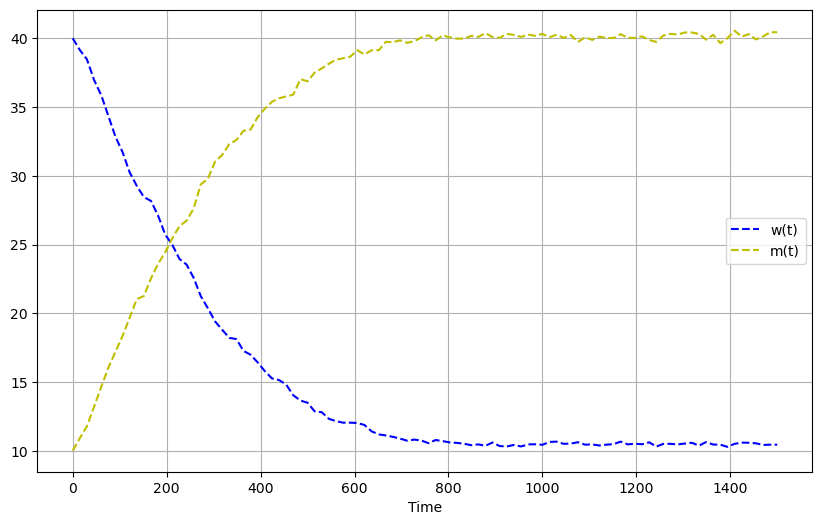

In [134]:
# Tracer les résultats avec des barres d'erreur
plt.figure(figsize=(10, 6))
plt.plot(time_points,w_mean,"b--",label="w(t)")
plt.plot(time_points,m_mean,"y--",label="m(t)")
plt.xlabel('Time')
plt.legend()
plt.grid(True)
plt.show()

### graphe de h_mean sans SEM


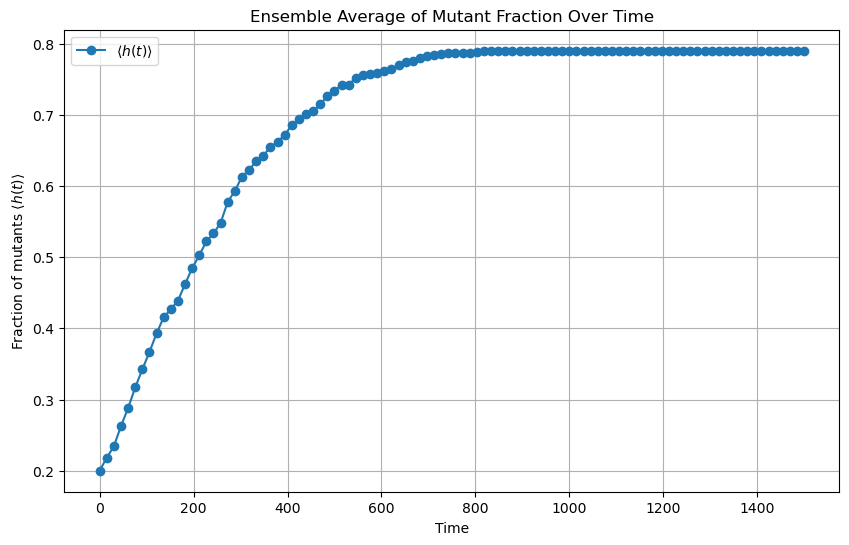

In [127]:
# Tracer les résultats avec des barres d'erreur
plt.figure(figsize=(10, 6))
plt.plot(time_points, h_mean, marker='o', label=r'$\langle h(t) \rangle$')
plt.xlabel('Time')
plt.ylabel(r'Fraction of mutants $\langle h(t) \rangle$')
plt.title('Ensemble Average of Mutant Fraction Over Time')
plt.legend()
plt.grid(True)
plt.show()

### calcul avec standard error mean 

variability of sample means in a sampling distribution of means. SEM assesses how far your sample mean is likely to fall from the population mean. It evaluates how closely your sample estimates the population. 


When you take a sample of observations from a population and calculate the sample mean, you are estimating of the parametric mean, or mean of all of the individuals in the population. Your sample mean won't be exactly equal to the parametric mean that you're trying to estimate, and you'd like to have an idea of how close your sample mean is likely to be. If your sample size is small, your estimate of the mean won't be as good as an estimate based on a larger sample size.


In [128]:
h_std=np.std(h_mean)
#h_std #écart-type des moyennes des simulations 
h_sem = h_std/ np.sqrt(num_simulations)
h_sem #SEM pour chaque point de temps 
#estimation de l'incertitude de la moyenne des simulations à chaque instant dans le temps

0.015863022565989513

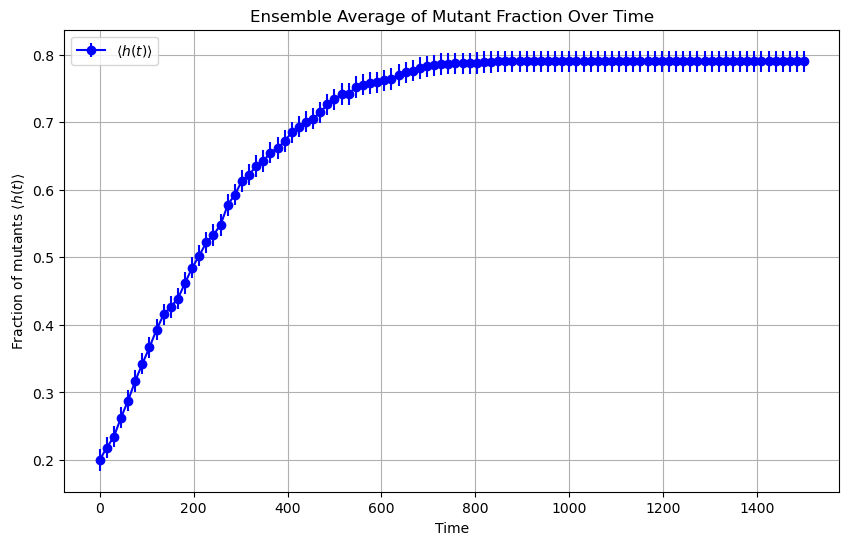

In [129]:

# Tracer les résultats avec des barres d'erreur
plt.figure(figsize=(10, 6))
plt.errorbar(time_points, h_mean, yerr=h_sem, fmt='b-', marker='o', label=r'$\langle h(t) \rangle$')
plt.xlabel('Time')
plt.ylabel(r'Fraction of mutants $\langle h(t) \rangle$')
plt.title('Ensemble Average of Mutant Fraction Over Time')
plt.legend()
plt.grid(True)
plt.show()

### graphe des courbes de M (mutants)  pour chaque simulations

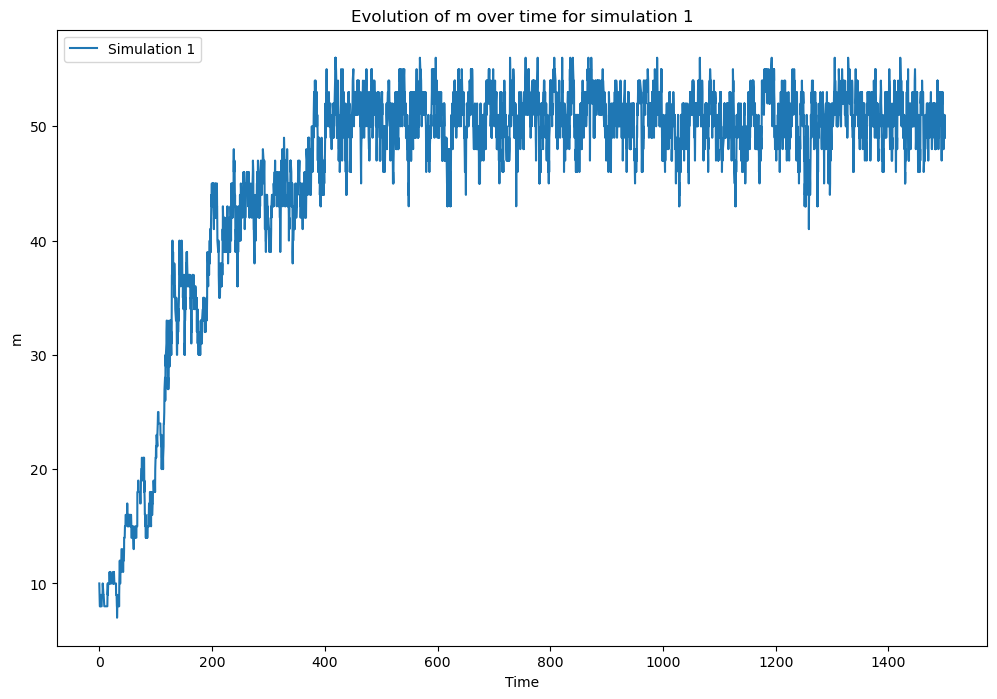

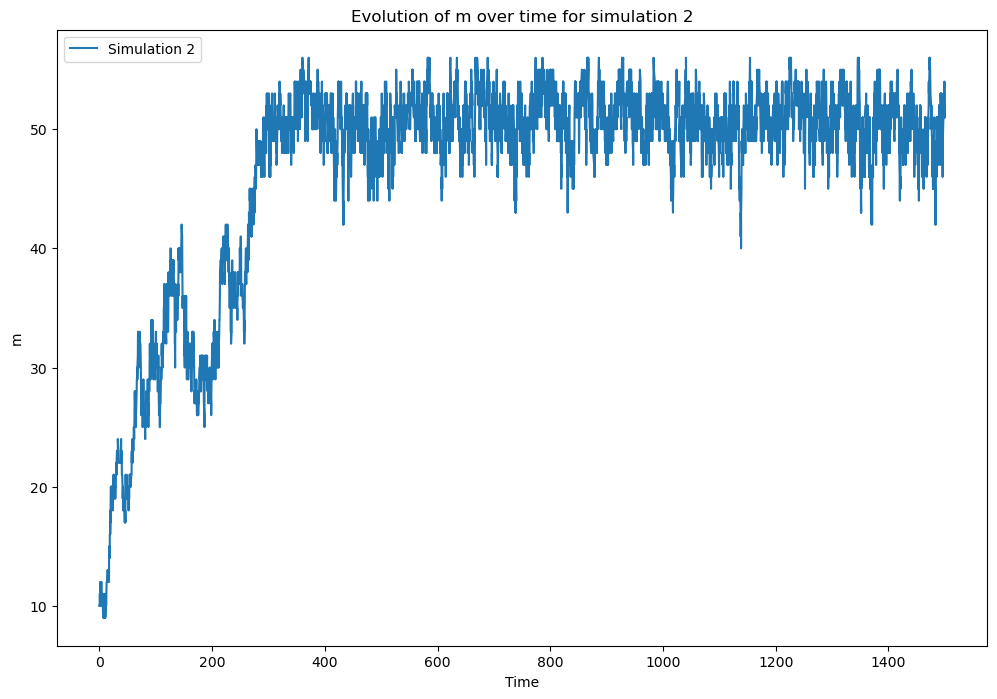

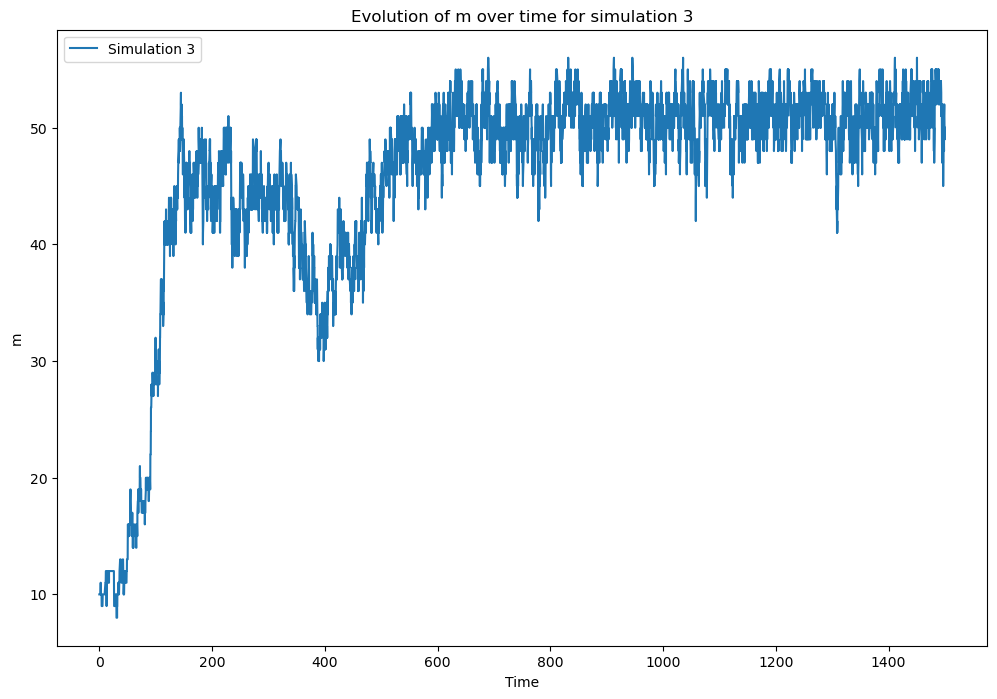

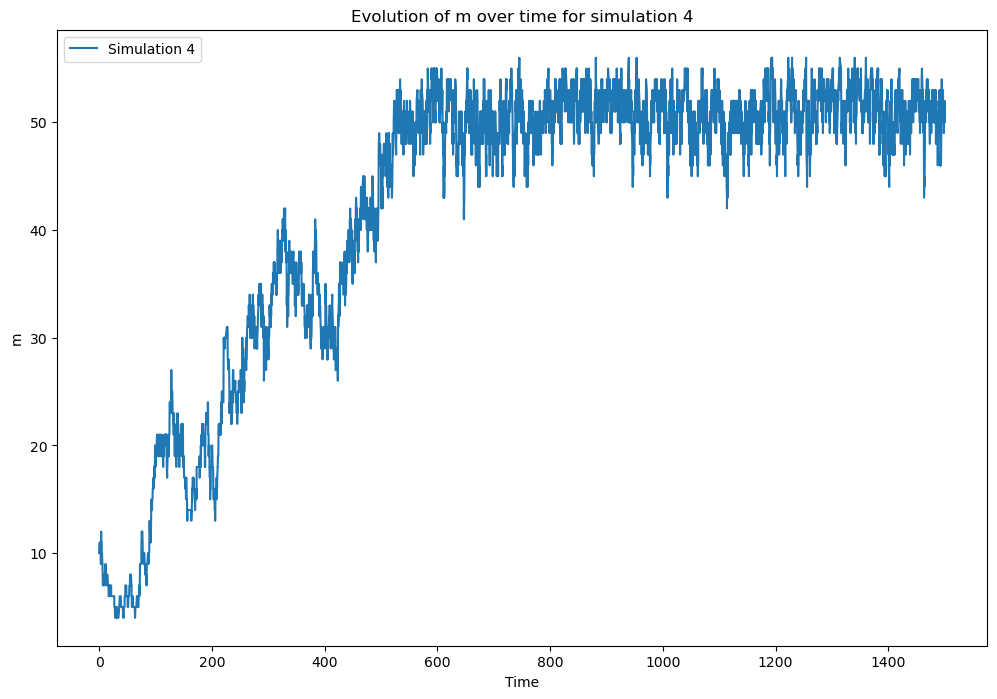

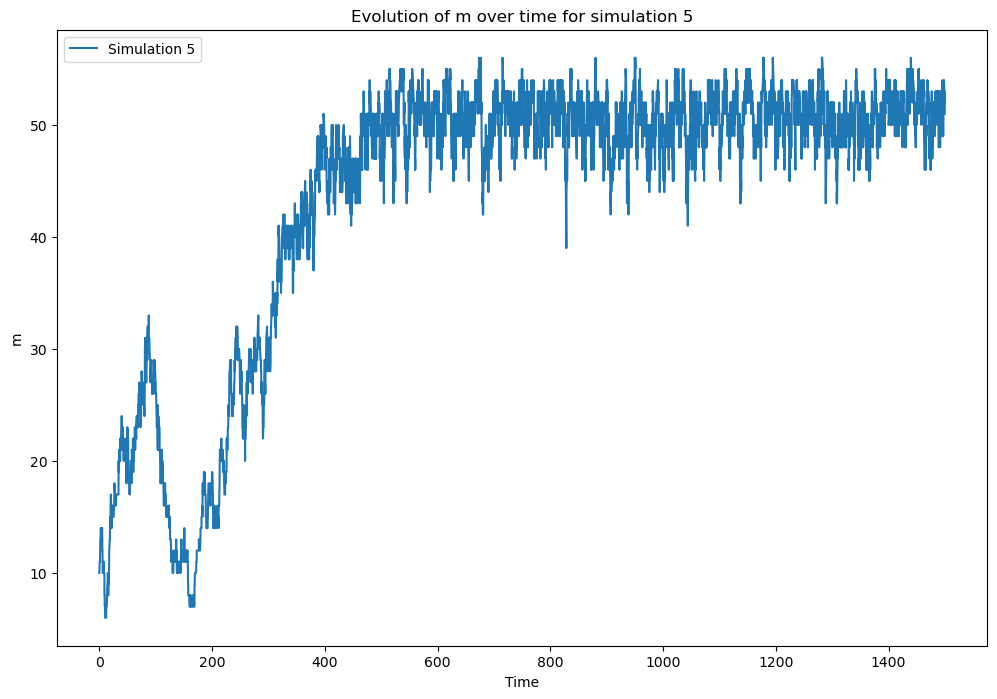

...

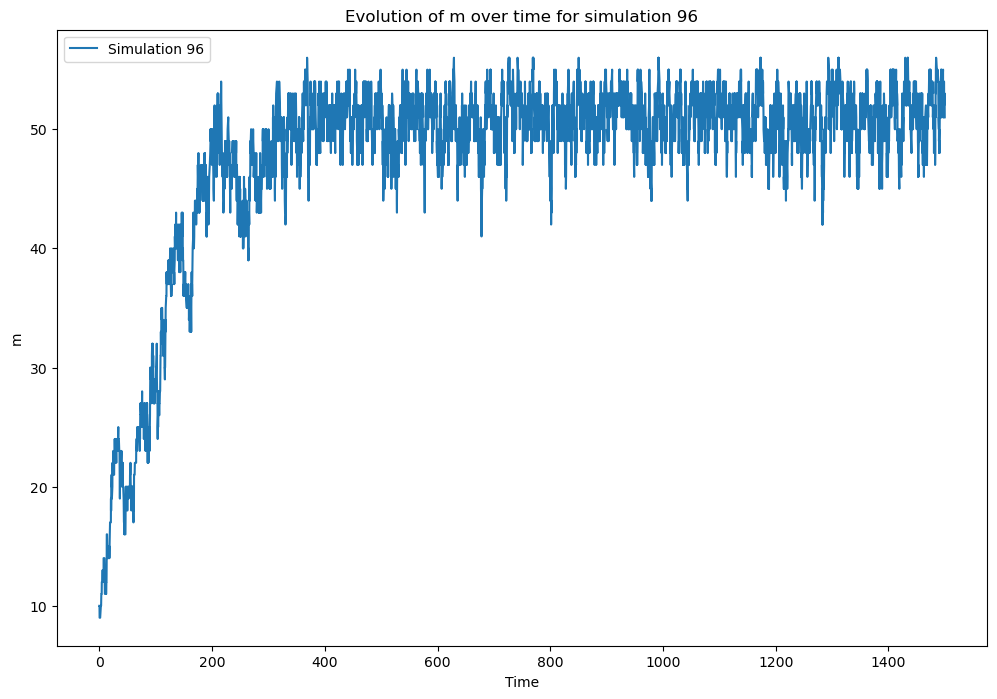

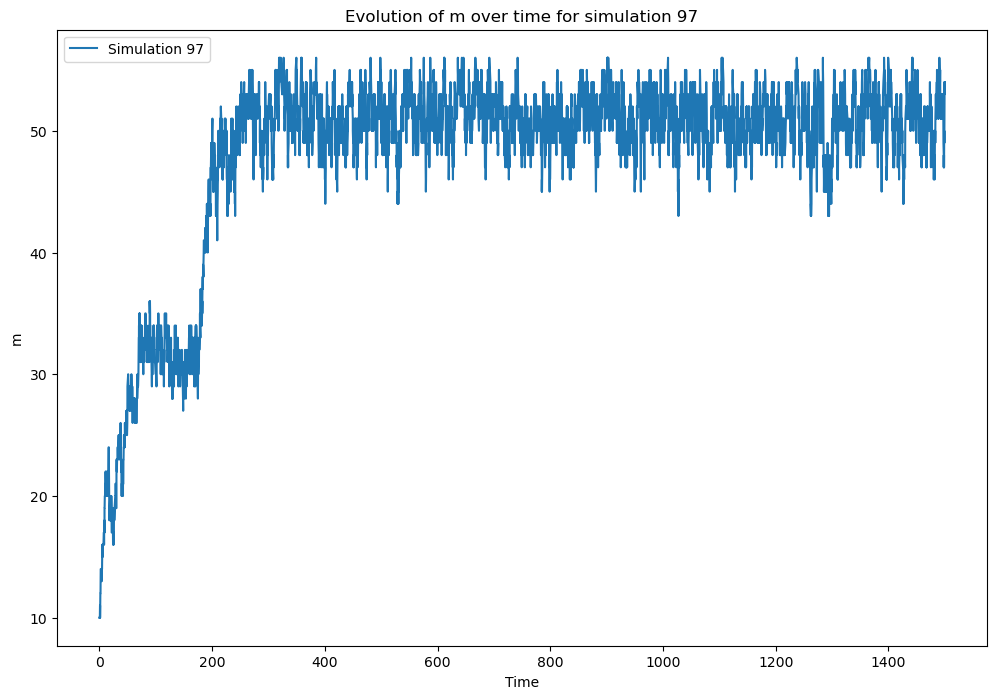

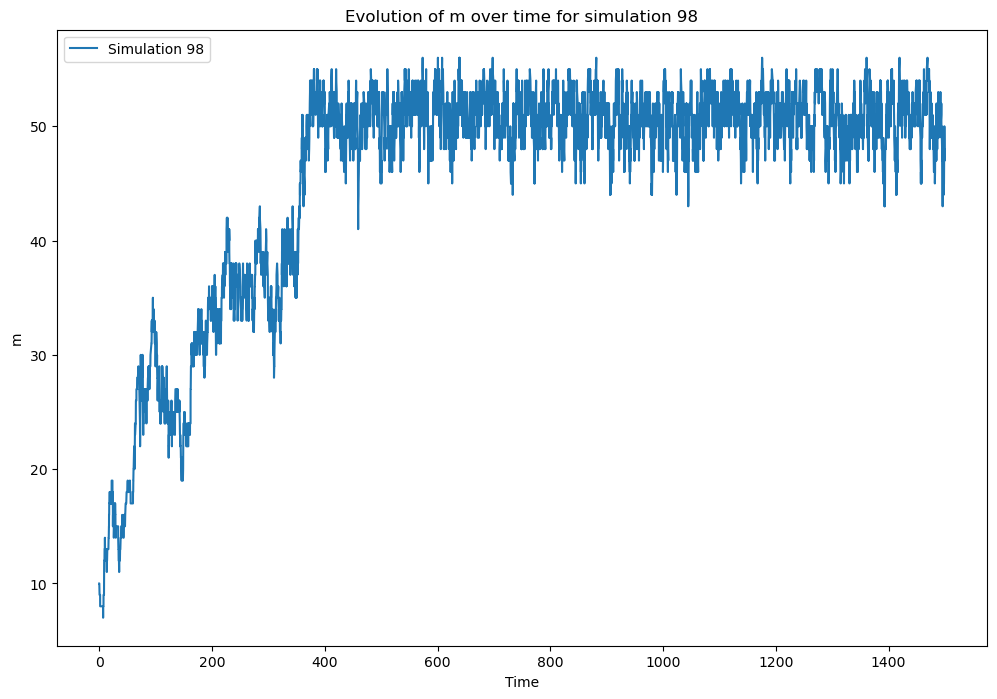

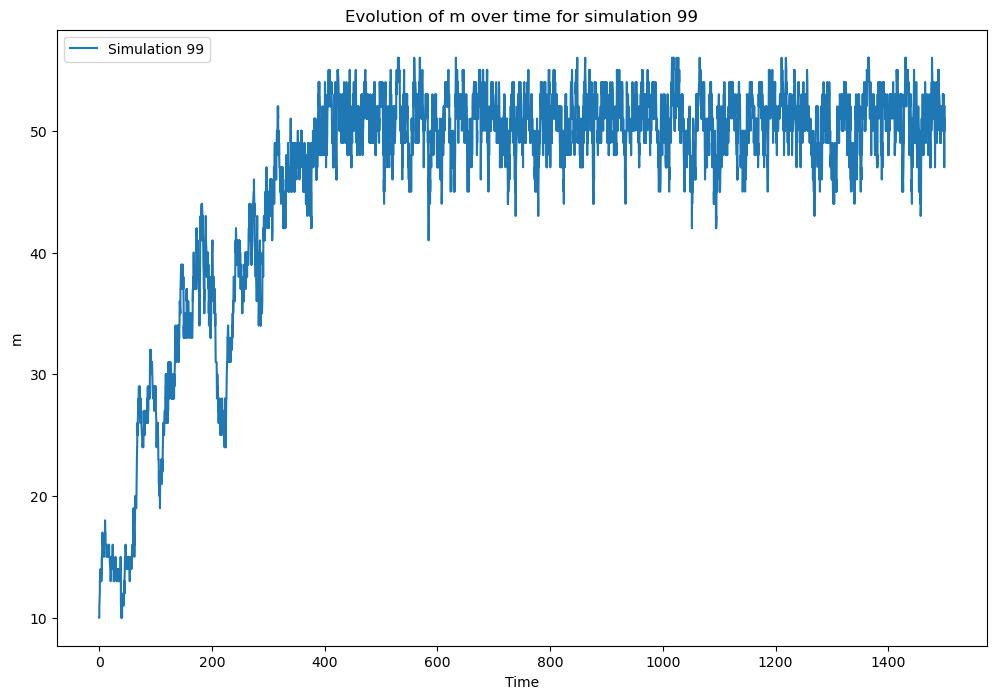

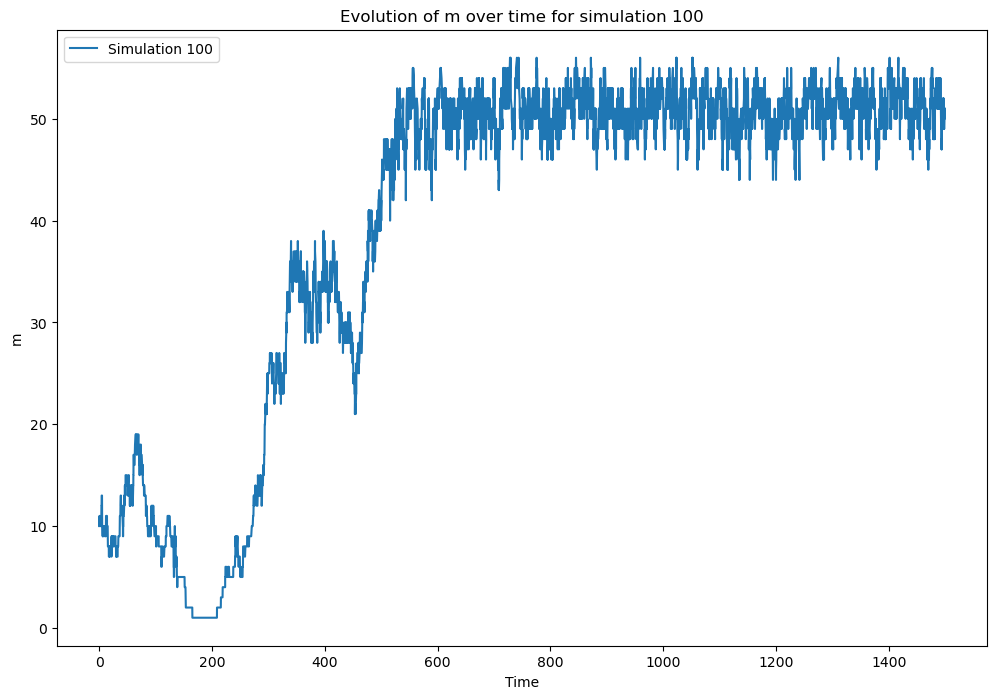

In [130]:
# Tracer chaque simulation sur un graphe séparé
for sim in range(num_simulations):
    plt.figure(figsize=(12, 8))
    times = all_times[sim]
    populations = all_populations[sim]
    m_values = [pop[1] for pop in populations]  # Extraire les valeurs de m
    plt.plot(times, m_values, label=f'Simulation {sim+1}')
    plt.xlabel('Time')
    plt.ylabel('m')
    plt.title(f'Evolution of m over time for simulation {sim+1}')
    plt.legend()
    plt.show()

In [133]:
import pandas as pd

# Initialiser une liste pour stocker les résultats
final_values = []

# Parcourir chaque simulation pour extraire les valeurs finales de m et w
for sim in range(num_simulations):
    times = all_times[sim]
    populations = all_populations[sim]
    w_final = populations[-1][0]  # Dernière valeur de w
    m_final = populations[-1][1]  # Dernière valeur de m
    final_values.append([sim+1, w_final, m_final])  # Ajouter les valeurs finales à la liste

# Convertir la liste en DataFrame
df_final_values = pd.DataFrame(final_values, columns=['Simulation', 'w_final', 'm_final'])
print(df_final_values)
mean_m_final = df_final_values['m_final'].mean()

print(f"La moyenne des valeurs finales de m sur {num_simulations} simulations est : {mean_m_final}")


df_final_values.to_csv('final_values_simulations.csv', index=False)

    Simulation  w_final  m_final
0            1        0       49
1            2        0       51
2            3        0       50
3            4        0       51
4            5        0       51
..         ...      ...      ...
95          96        0       51
96          97        0       54
97          98        0       48
98          99        0       52
99         100        0       51

[100 rows x 3 columns]
La moyenne des valeurs finales de m sur 100 simulations est : 40.51


In [135]:
# Tracer les courbes de m pour chaque simulation
#plt.figure(figsize=(12, 8))
for sim in range(num_simulations):
    times = all_times[sim]
    populations = all_populations[sim]
    m_values = [pop[1] for pop in populations]  # Extraire les valeurs de m
    print(f"Les valeurs finales de m pour la simulation {sim+1} sont : {m_values}")
    print("\n")
    #plt.plot(times, m_values, label=f'Simulation {sim+1}')


Les valeurs finales de m pour la simulation 1 sont : [10, 9, 9, 8, 8, 8, 9, 9, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 9, 9, 9, 9, 9, 10, 9, 9, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 9, 9, 10, 10, 9, 10, 10, 10, 10, 10, 10, 10, 11, 10, 10, 10, 10, 11, 11, 11, 11, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 11, 11, 10, 11, 10, 10, 11, 11, 11, 11, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 9, 9, 9, 9, 9, 9, 9, 8, 8, 8, 8, 7, 7, 8, 8, 8, 9, 9, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 8, 9, 10, 10, 11, 12, 12, 11, 11, 10, 10, 10, 10, 10, 11, 11, 11, 11, 11, 11, 11, 11, 12, 12, 12, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 12, 12, 12, 12, 12, 11, 11, 12, 12, 12, 12, 12, 12, 12, 13, 13, 14, 14, 14, 14, 15, 15, 15, 15, 15, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 17, 16, 15, 15, 15, 15, 15, 15, 16, 15, 15, 15, 15, 16, 16, 16, 16, 16, 16, 16, 16, 15, 15, 16, 16, 16, 15, 15, 15, 15, 15, 15, 15, 16, 16, 16, 16, 16, 16, 15, 15

Les valeurs finales de m pour la simulation 12 sont : [10, 11, 11, 11, 10, 11, 11, 11, 11, 11, 12, 12, 12, 11, 11, 10, 10, 11, 11, 11, 11, 11, 10, 10, 10, 10, 10, 9, 9, 9, 9, 9, 9, 9, 9, 8, 7, 7, 7, 7, 7, 7, 7, 8, 7, 7, 7, 7, 7, 7, 8, 9, 9, 9, 9, 9, 10, 11, 11, 11, 11, 11, 11, 11, 11, 11, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 11, 11, 11, 11, 12, 13, 13, 13, 13, 13, 13, 13, 13, 13, 12, 12, 12, 12, 12, 12, 13, 13, 13, 13, 13, 13, 12, 12, 12, 13, 13, 13, 13, 13, 13, 13, 13, 13, 14, 13, 13, 13, 13, 13, 13, 14, 15, 15, 15, 15, 16, 17, 17, 16, 16, 15, 16, 16, 16, 16, 16, 16, 16, 16, 16, 16, 17, 17, 17, 16, 16, 16, 16, 16, 17, 16, 16, 17, 18, 18, 19, 19, 19, 19, 18, 17, 17, 17, 16, 16, 16, 16, 15, 16, 16, 16, 16, 16, 16, 16, 17, 18, 17, 16, 16, 15, 16, 15, 15, 15, 15, 15, 15, 15, 14, 14, 14, 14, 13, 14, 13, 13, 13, 13, 13, 14, 14, 14, 14, 14, 14, 14, 15, 15, 14, 13, 13, 12, 12, 12, 11, 11, 11, 11, 11, 11, 10, 10, 10, 11, 11, 11, 11, 11, 11, 11, 11, 11

Les valeurs finales de m pour la simulation 33 sont : [10, 10, 10, 10, 10, 9, 9, 9, 9, 9, 9, 9, 9, 10, 10, 11, 11, 11, 10, 11, 11, 11, 11, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 11, 10, 10, 9, 9, 9, 9, 9, 9, 10, 10, 9, 9, 9, 9, 9, 9, 9, 9, 9, 10, 10, 10, 10, 10, 10, 10, 10, 11, 11, 12, 11, 11, 11, 12, 13, 12, 12, 11, 11, 11, 11, 11, 11, 11, 10, 10, 10, 10, 9, 9, 9, 9, 10, 11, 12, 12, 11, 11, 11, 11, 11, 11, 11, 10, 11, 11, 11, 10, 10, 9, 9, 10, 9, 9, 10, 10, 10, 10, 9, 10, 10, 9, 9, 9, 8, 8, 8, 8, 9, 10, 10, 10, 10, 10, 10, 11, 11, 12, 12, 12, 12, 12, 12, 11, 11, 12, 12, 12, 11, 11, 12, 12, 13, 14, 14, 14, 13, 12, 12, 13, 13, 13, 13, 13, 13, 12, 12, 12, 12, 12, 12, 12, 12, 12, 11, 11, 11, 11, 11, 12, 12, 13, 13, 13, 12, 12, 11, 11, 11, 11, 11, 10, 9, 10, 10, 10, 9, 10, 10, 10, 10, 11, 12, 12, 12, 12, 11, 11, 10, 10, 9, 9, 9, 9, 9, 9, 9, 8, 8, 8, 8, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 7, 7, 7, 7, 7, 7, 7

Les valeurs finales de m pour la simulation 60 sont : [10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 11, 11, 11, 11, 11, 11, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 11, 12, 12, 11, 11, 11, 11, 11, 11, 10, 10, 10, 11, 11, 11, 11, 11, 12, 12, 12, 12, 12, 12, 12, 12, 11, 11, 11, 11, 11, 11, 11, 10, 10, 9, 10, 11, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 12, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 13, 12, 11, 11, 11, 12, 11, 12, 12, 12, 12, 12, 12, 12, 12, 13, 13, 13, 13, 14, 14, 13, 14, 13, 13, 14, 13, 13, 12, 12, 12, 12, 12, 12, 13, 14, 14, 14, 14, 14, 14, 14, 15, 15, 15, 15, 15, 15, 15, 15, 15, 16, 17, 17, 18, 18, 19, 18, 19, 20, 19, 19, 19, 19, 19, 18, 18, 18, 17, 17, 17, 17, 17, 17, 16, 16, 16, 17, 18, 18, 17, 18, 18, 19, 19, 19, 20, 21, 21, 20, 21, 22, 21, 20, 21, 21, 22, 22, 22, 22, 23, 23, 22, 22, 23, 24, 24, 24, 23, 23, 22, 21, 21, 22, 22, 22, 21, 21, 22, 21, 21, 22, 23, 23, 24, 23, 22, 23, 23, 22

Les valeurs finales de m pour la simulation 82 sont : [10, 10, 10, 10, 10, 11, 11, 10, 10, 10, 11, 10, 10, 10, 11, 11, 11, 11, 10, 11, 11, 10, 10, 10, 10, 10, 10, 11, 11, 11, 11, 12, 12, 12, 12, 12, 12, 12, 13, 14, 14, 14, 14, 14, 13, 12, 12, 12, 12, 12, 12, 11, 11, 12, 12, 11, 11, 10, 10, 10, 10, 10, 10, 10, 10, 10, 10, 11, 11, 11, 11, 10, 10, 10, 10, 10, 10, 10, 11, 11, 12, 11, 12, 12, 12, 12, 11, 11, 11, 11, 11, 10, 10, 9, 9, 8, 8, 8, 8, 8, 8, 8, 7, 7, 8, 8, 8, 8, 8, 8, 8, 7, 7, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 5, 5, 5, 5, 5, 5, 5, 5, 4, 4, 4, 4, 4, 4, 4, 4, 4, 3, 3, 3, 3, 3, 3, 3, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

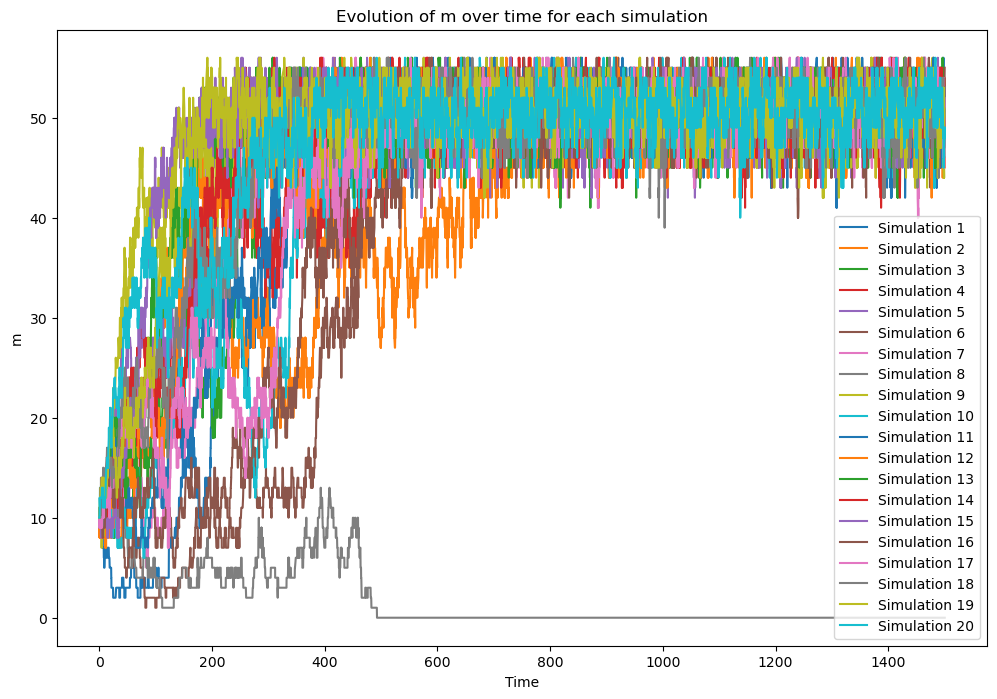

In [49]:
plt.figure(figsize=(12, 8))
for sim in range(num_simulations):
    times = all_times[sim]
    populations = all_populations[sim]
    m_values = [pop[1] for pop in populations]  # Extraire les valeurs de m
    #print(f"Les valeurs de m pour la simulation {sim+1} sont : {m_values}")
    #print("\n")
    plt.plot(times, m_values, label=f'Simulation {sim+1}')

plt.xlabel('Time')
plt.ylabel('m')
plt.title('Evolution of m over time for each simulation')
plt.legend()
plt.show()

### Graphe pour W (wildtypes) pour chaque simulations


In [50]:
for sim in range(num_simulations):
    times = all_times[sim]
    populations = all_populations[sim]
    w_values = [pop[0] for pop in populations]  # Extraire les valeurs de m
    print(f"Les valeurs de w pour la simulation {sim+1} sont : {w_values}")
    print("\n")
    


Les valeurs de w pour la simulation 1 sont : [40, 39, 40, 40, 41, 42, 42, 41, 42, 41, 41, 40, 39, 38, 37, 38, 39, 40, 41, 42, 41, 40, 41, 42, 42, 42, 43, 44, 43, 42, 41, 41, 41, 42, 43, 44, 45, 44, 43, 42, 43, 43, 42, 43, 44, 45, 46, 46, 47, 46, 47, 46, 46, 45, 46, 47, 48, 48, 47, 47, 47, 48, 47, 46, 46, 47, 46, 45, 44, 45, 44, 45, 46, 45, 44, 43, 44, 45, 45, 44, 45, 44, 44, 45, 46, 45, 45, 44, 43, 42, 41, 42, 41, 40, 41, 42, 43, 44, 45, 46, 47, 47, 46, 47, 46, 46, 47, 46, 45, 46, 45, 46, 45, 44, 45, 46, 46, 45, 44, 43, 44, 43, 44, 43, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 50, 51, 51, 52, 51, 50, 49, 48, 49, 48, 49, 48, 47, 48, 49, 48, 47, 48, 49, 48, 47, 48, 49, 48, 47, 47, 48, 49, 50, 51, 50, 50, 51, 52, 51, 50, 51, 50, 49, 48, 49, 48, 47, 47, 46, 47, 48, 49, 50, 49, 48, 47, 48, 49, 50, 50, 49, 48, 47, 48, 47, 48, 48, 47, 46, 47, 48, 47, 48, 48, 49, 50, 51, 50, 49, 48, 47, 46, 47, 48, 49, 48, 47, 48, 47, 48, 49, 50, 51, 50, 51, 50, 49, 48, 47, 46, 47, 46, 47, 46, 47, 46, 45, 44, 43

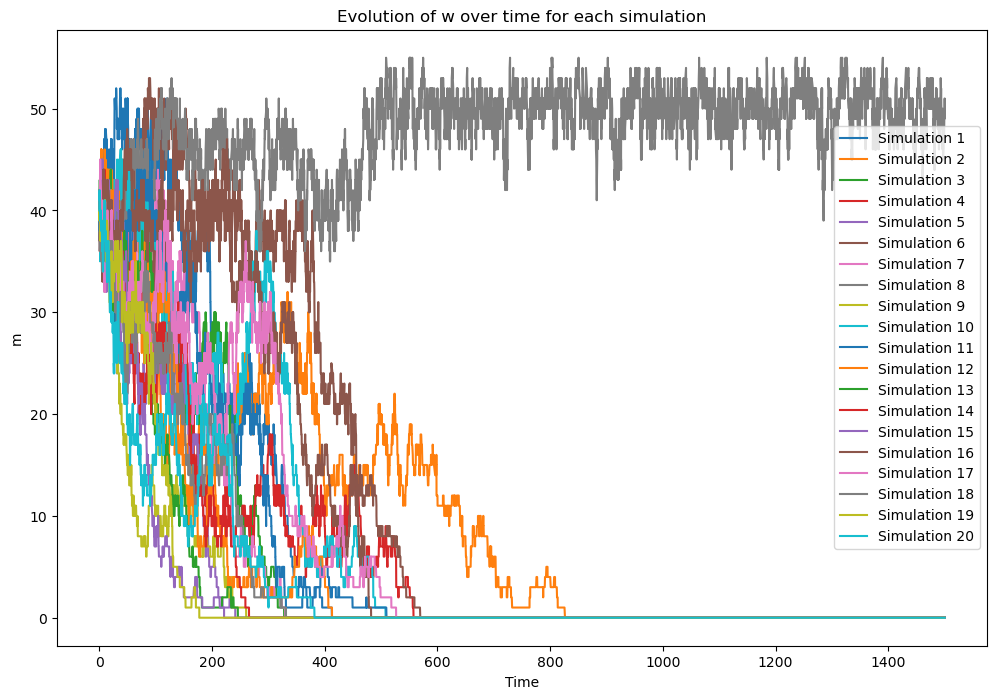

In [51]:
plt.figure(figsize=(12, 8))
for sim in range(num_simulations):
    times = all_times[sim]
    populations = all_populations[sim]
    w_values = [pop[0] for pop in populations]  # Extraire les valeurs de m
    #print(f"Les valeurs de m pour la simulation {sim+1} sont : {m_values}")
    #print("\n")
    plt.plot(times, w_values, label=f'Simulation {sim+1}')

plt.xlabel('Time')
plt.ylabel('m')
plt.title('Evolution of w over time for each simulation')
plt.legend()
plt.show()

## comparaison avec ODE 

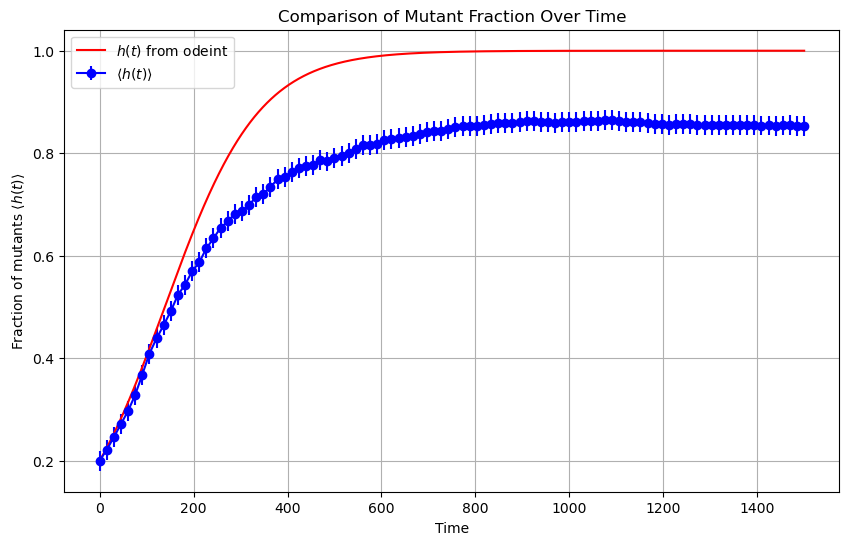

In [107]:

# Tracé des courbes
plt.figure(figsize=(10, 6))

# Tracer la courbe obtenue à partir des simulations
plt.errorbar(time_points, h_mean, yerr=h_sem, fmt='b-', marker='o', label=r'$\langle h(t) \rangle$')
# Tracer la courbe obtenue avec odeint
plt.plot(temps, h, 'r-', label=r'$h(t)$ from odeint')

# Ajout de légendes
plt.legend()

# Ajout de titres et d'étiquettes d'axes
plt.xlabel('Time')
plt.ylabel(r'Fraction of mutants $\langle h(t) \rangle$')
plt.title('Comparison of Mutant Fraction Over Time')
plt.grid(True)

# Affichage du graphe
plt.show()
